In [750]:
from __future__ import division

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

%load_ext autoreload
%autoreload 2

import matplotlib
from matplotlib import pyplot as plt
from matplotlib.ticker import NullFormatter
#matplotlib.rcParams['savefig.dpi'] = 1.5 * matplotlib.rcParams['savefig.dpi']

import os, glob
import corner
import acor
import numpy as np

import pandas as pd
from scipy.stats import rv_histogram

from PTMCMCSampler.PTMCMCSampler import PTSampler as ptmcmc

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [751]:
from pulsar_gibbs import PulsarBlockGibbs

In [745]:
import enterprise
from enterprise.pulsar import Pulsar
from enterprise.signals import parameter
from enterprise.signals import signal_base
import enterprise.signals.signal_base as base
from enterprise.signals import white_signals
from enterprise.signals import gp_signals
from enterprise.signals import utils

import enterprise_extensions as ee
from enterprise_extensions import models, model_utils, blocks

### Just 1713, simulated with $A_\mathrm{GWB}=2\times10^{-15}$ and $\gamma_\mathrm{GWB}=13/3$, plus red and white noise (a la astro4cast)

In [711]:
epsr = Pulsar('./data/simulated_data/J1713+0747.par',
              './data/simulated_data/J1713+0747.tim')

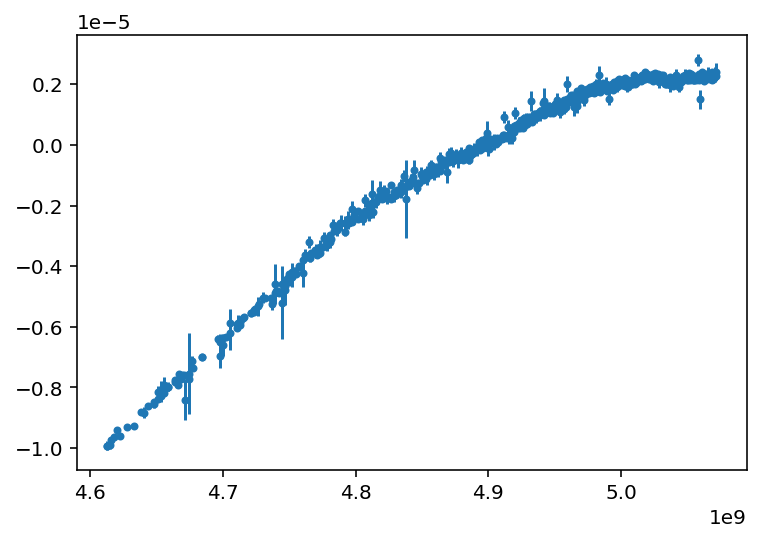

In [712]:
plt.errorbar(epsr.toas, epsr.residuals, epsr.toaerrs, fmt='.');

### Perform a free spectral recovery in this pulsar

In [764]:
##### parameters and priors #####

# Uniform prior on EFAC
efac = parameter.Constant(1.0)
ef = white_signals.MeasurementNoise(efac=efac)

# red noise 
rn = blocks.common_red_noise_block(psd='spectrum', components=30, name='gw')

# timing model
tm = gp_signals.TimingModel(use_svd=True)

# full model is sum of components
model = ef + rn + tm

# initialize PTA
pta = signal_base.PTA([model(epsr)])

In [765]:
gibbs = PulsarBlockGibbs(pta=pta)

ERROR: Gibbs outlier analysis must use basis_ecorr, not kernel ecorr
Basis count is good


In [766]:
x0 = np.concatenate([p.sample().flatten() for p in gibbs.params])

In [767]:
gibbs.sample(x0, outdir='./gibbs_astro4cast_1713sim/', 
             niter=10000, resume=False)

Creating chain directory: ./gibbs_astro4cast_1713sim/
Finished 99 percent in 47.4306 seconds.

In [768]:
chain = np.loadtxt('./gibbs_astro4cast_1713sim/chain.txt')

In [769]:
for ii in range(30):
    print(acor.acor(chain[100:,ii])[0])

2.742067462924675
1.1675681871081063
2.2908126841019496
13.681851287136778
11.769242989627303
3.202225426306386
9.523422260295684
4.3593148463559315
6.424319797512014
4.567110586517478
5.830588485146388
5.324214837638707
3.944176665093482
10.572203201394327
8.929660649386307
3.5064821383018923
6.69104791226773
7.800192601920308
3.548986855554586
3.2582099172840624
3.5845794958916377
3.0824546720730215
4.170528044233102
3.0559437789737385
3.9407644651108957
3.1263931014462365
4.477687774344247
2.9078240259775985
7.459243956432482
2.8379009841790297


In [770]:
rho_labels = ['gw_log10_rho_'+str(ii) for ii in range(30)]
freespec = pd.read_csv('./gibbs_astro4cast_1713sim/chain.txt', names=rho_labels, delim_whitespace=True)

In [771]:
# frequency data
Tspan = epsr.toas.max() - epsr.toas.min()
inv_T = 1/Tspan
freqs = np.arange(1,31)*inv_T
no_freqs = len(freqs)

In [772]:
# plotting violin plots
rho_bins = np.linspace(-9, -4, num=400) # rho bins
drho = rho_bins[1]-rho_bins[0]

# turning freespec into rv hist and sampling
epsilon = 1e-250  # make histograms for each rho
histograms = np.array([np.histogram(freespec[rho], rho_bins, density=True)[0]
                       for rho in rho_labels])

bin_mid = (rho_bins[1:] + rho_bins[:-1]) / 2.0
rvhist = [rv_histogram([hist, rho_bins]) for hist in histograms]

# draw samples from histograms for each rho
rv_samples = [rvh.rvs(size=100000) for rvh in rvhist]

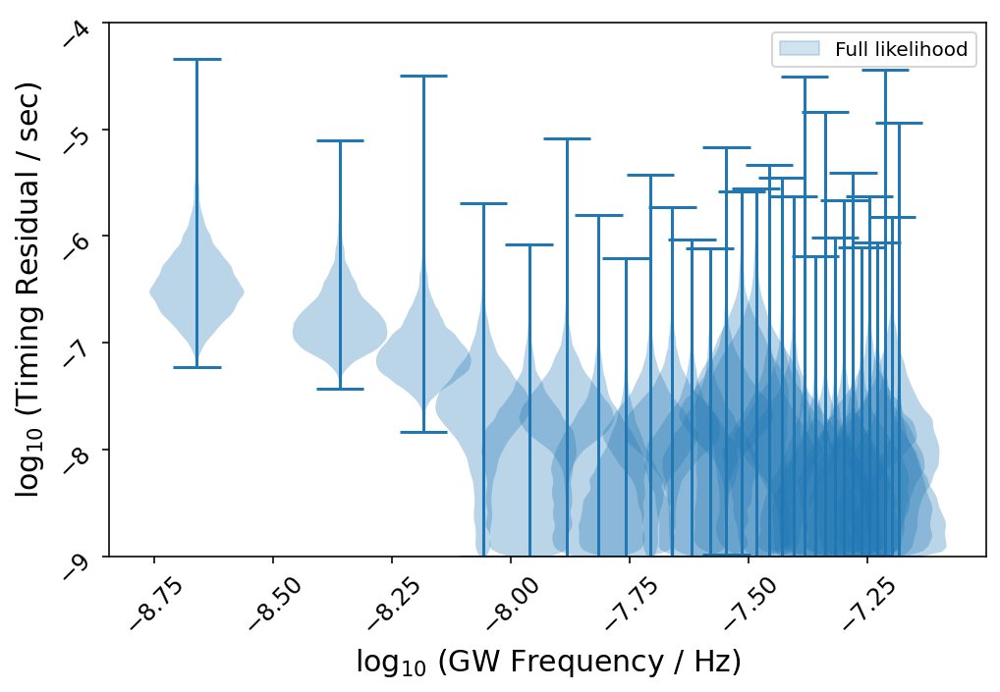

In [773]:
# overplot powerlaw on violinplot of random samples
plt.figure(figsize=(8,8))
v1 = plt.violinplot(rv_samples, positions=np.log10(freqs), widths=0.2)

plt.xlabel(r'$\log_{10}$ (GW Frequency / Hz)', fontsize=15)
plt.ylabel(r'$\log_{10}$ (Timing Residual / sec)', fontsize=15);

import matplotlib.patches as mpatches
import matplotlib.lines as mlines

plp = mlines.Line2D([], [], color='k', label='Injected')
plt.legend(handles=[fs]) #[fs, plp])

plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12, rotation=45)

plt.ylim(-9,-4)

fig = matplotlib.pyplot.gcf()
fig.set_size_inches(8, 5)
plt.show()

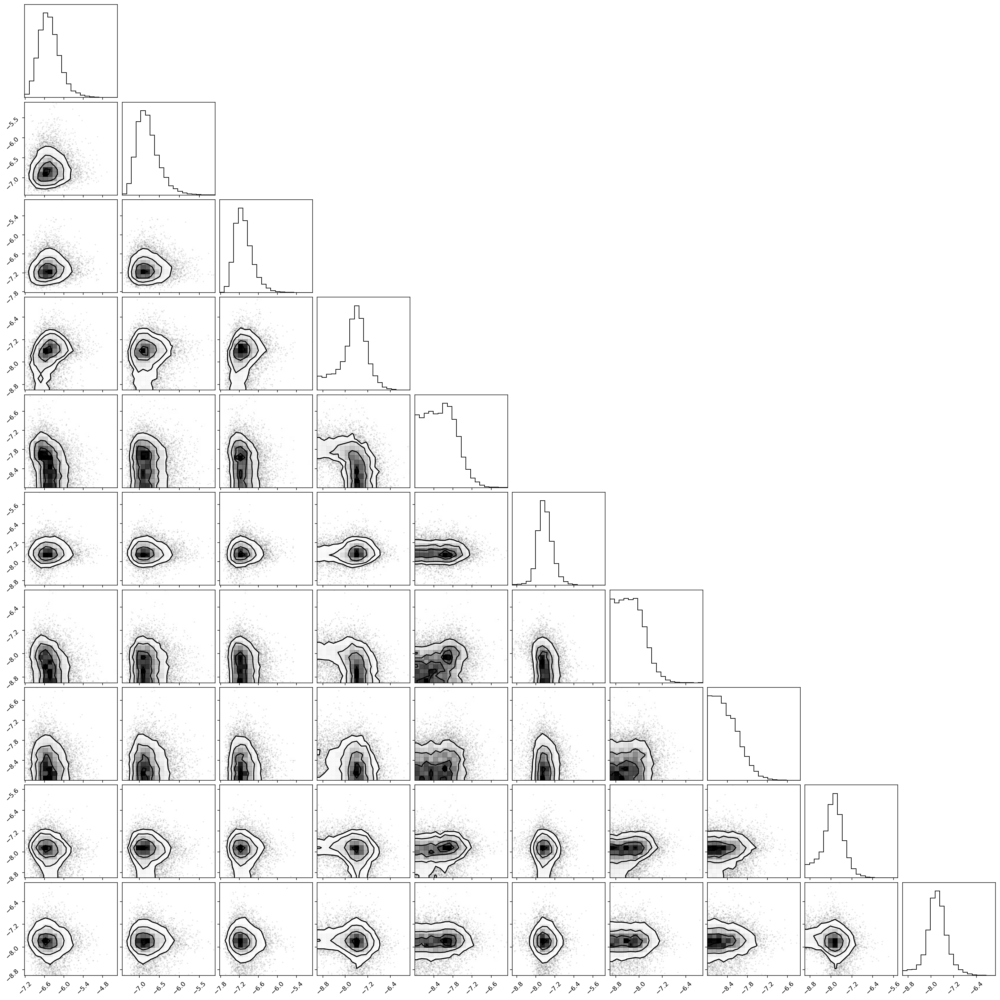

In [774]:
corner.corner(chain[100:,:10]);

### New implementation using numerical CDFs to sample free spectrum and power-law red noise in single pulsar

In [315]:
from pta_gibbs import PTABlockGibbs2

In [195]:
gibbs2 = PTABlockGibbs2(pta=pta, hypersample='conditional', ecorrsample='mh', psr=epsr)

ERROR: Gibbs outlier analysis must use basis_ecorr, not kernel ecorr


In [196]:
x0 = np.concatenate([p.sample().flatten() for p in gibbs2.params])

In [197]:
gibbs2.sample(x0, outdir='./gibbs2_1713sim/', 
             niter=10000, resume=False)

Creating chain directory: ./gibbs2_1713sim/
Finished 99 percent in 51.3727 seconds.

In [198]:
chain2 = np.loadtxt('./gibbs2_1713sim/chain.txt')

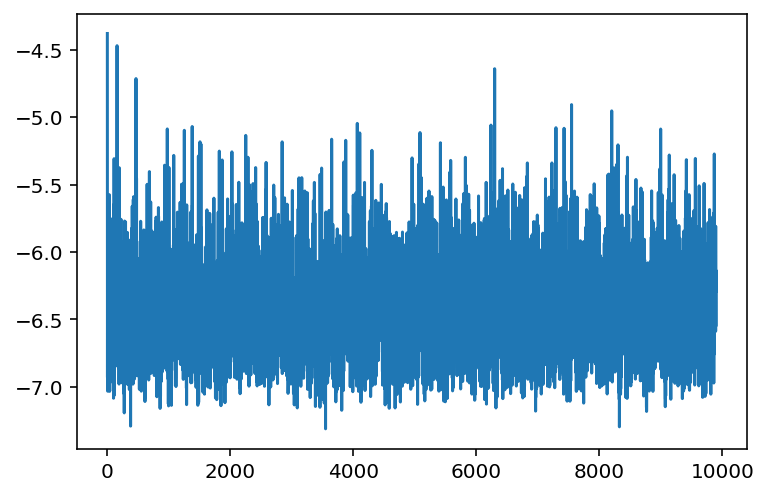

In [199]:
plt.plot(chain[:,0]);
plt.show()

In [200]:
rho_labels = ['gw_log10_rho_'+str(ii) for ii in range(30)]
freespec2 = pd.read_csv('./gibbs2_1713sim/chain.txt', names=rho_labels, delim_whitespace=True)

In [249]:
# -------
# plotting violin plots
rho_bins = np.linspace(-9, -4, num=400) # rho bins
drho = rho_bins[1]-rho_bins[0]

# turning freespec into rv hist and sampling
epsilon = 1e-250  # make histograms for each rho
histograms = np.array([np.histogram(freespec2[rho], rho_bins, density=True)[0]
                       for rho in rho_labels])

bin_mid = (rho_bins[1:] + rho_bins[:-1]) / 2.0
rvhist = [rv_histogram([hist, rho_bins]) for hist in histograms]

# draw samples from histograms for each rho
rv_samples = [rvh.rvs(size=100000) for rvh in rvhist]

# calculate powerlaw
p0 = [13/3, -14.7]
pl = powerlaw(*p0)

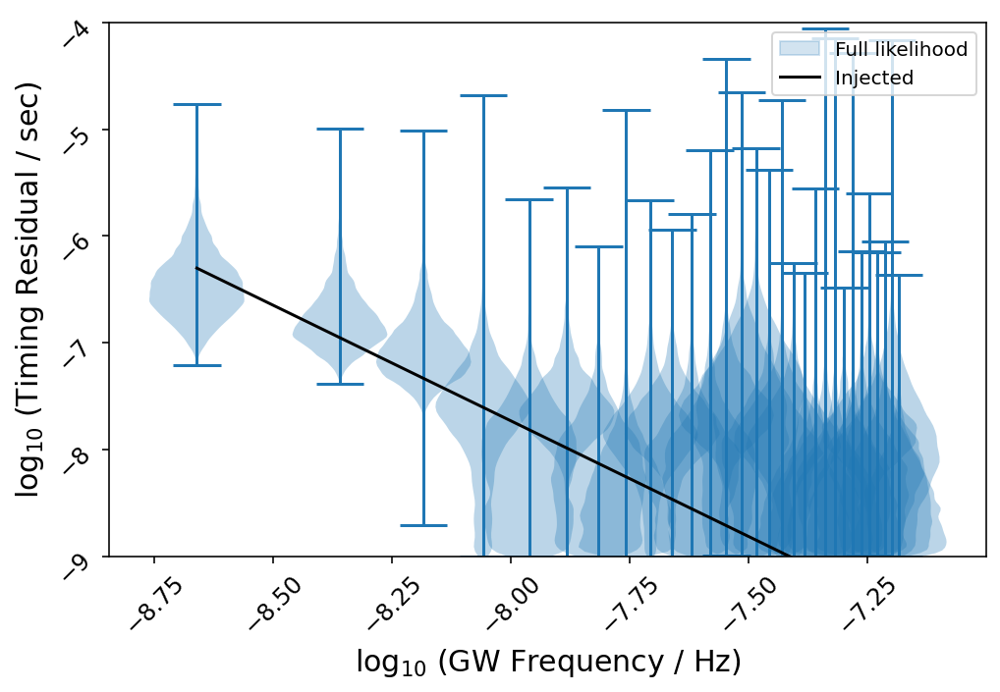

In [250]:
# overplot powerlaw on violinplot of random samples
plt.figure(figsize=(8,8))
v1 = plt.violinplot(rv_samples, positions=np.log10(freqs), widths=0.2)

plt.plot(np.log10(freqs), pl, color='k')
plt.xlabel(r'$\log_{10}$ (GW Frequency / Hz)', fontsize=15)
plt.ylabel(r'$\log_{10}$ (Timing Residual / sec)', fontsize=15);

import matplotlib.patches as mpatches
import matplotlib.lines as mlines

fs = mpatches.Patch(color='C0', label='Full likelihood', alpha=0.2)
plp = mlines.Line2D([], [], color='k', label='Injected')
plt.legend(handles=[fs, plp])

plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12, rotation=45)

plt.ylim(-9,-4)

fig = matplotlib.pyplot.gcf()
fig.set_size_inches(8, 5)
plt.show()
#plt.savefig('/home/taylosr8/pta_work/gfl_spec_nsfproposal_pilot2.pdf',bbox_inches='tight',dpi=400)

In [203]:
for ii in range(30):
    print(acor.acor(chain2[100:,ii])[0])

4.554215135149716
1.1717559646524636
1.7010954632598598
17.57993911520705
13.023006012331347
4.638954409088094
8.404446401015067
4.691622870661024
5.368196198736044
6.00010698054858
5.215533727209207
6.436176699574714
3.295344940688996
10.309170034013697
12.513213301285672
5.591123841825296
7.2760435508080805
6.530050181759061
3.916361844247509
3.854482825170889
3.640004557269704
3.531205688642606
4.43384037514936
3.7209635206816607
5.394899461741665
2.3690894226952692
4.6244499376612955
4.201029214563129
8.128960785198267
2.8712030938833695


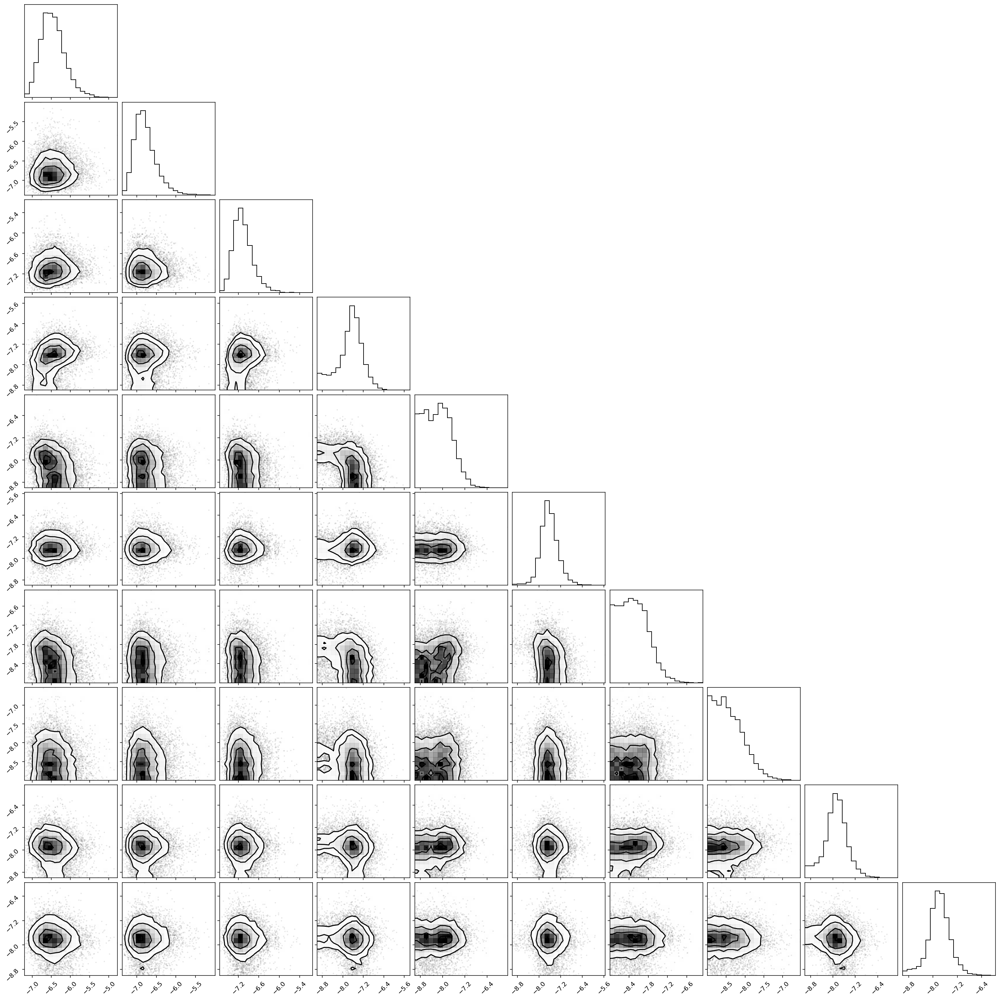

In [204]:
corner.corner(chain2[100:,:10]);

In [288]:
##### parameters and priors #####

# Uniform prior on EFAC
efac = parameter.Constant(1.0)
ef = white_signals.MeasurementNoise(efac=efac)

# red noise 
rn = blocks.common_red_noise_block(psd='spectrum', components=30, name='gw')

rn += blocks.common_red_noise_block(psd='powerlaw', components=30, name='red')

# timing model
tm = gp_signals.TimingModel(use_svd=True)

# full model is sum of components
model = ef + rn + tm

# initialize PTA
pta2 = signal_base.PTA([model(epsr)])

In [289]:
pta2.params

[gw_log10_rho:Uniform(pmin=-9, pmax=-4)[30],
 red_gamma:Uniform(pmin=0, pmax=7),
 red_log10_A:Uniform(pmin=-18, pmax=-11)]

In [316]:
gibbs3 = PTABlockGibbs2(pta=pta2, hypersample='conditional', ecorrsample='mh', psr=epsr)

ERROR: Gibbs outlier analysis must use basis_ecorr, not kernel ecorr


In [317]:
x0 = np.concatenate([p.sample().flatten() for p in gibbs3.params])

In [318]:
gibbs3.sample(x0, outdir='./gibbs3_1713sim/', 
             niter=10000, resume=False)

Creating chain directory: ./gibbs3_1713sim/


/Users/taylosr8/miniconda3/envs/enterprise/lib/python3.9/site-packages/enterprise/signals/parameter.py:62: RuntimeWarning: divide by zero encountered in log
  logpdf = np.log(self.prior(value, **kwargs))


Finished 99 percent in 390.466 seconds.

In [319]:
chain3 = np.loadtxt('./gibbs3_1713sim/chain.txt')

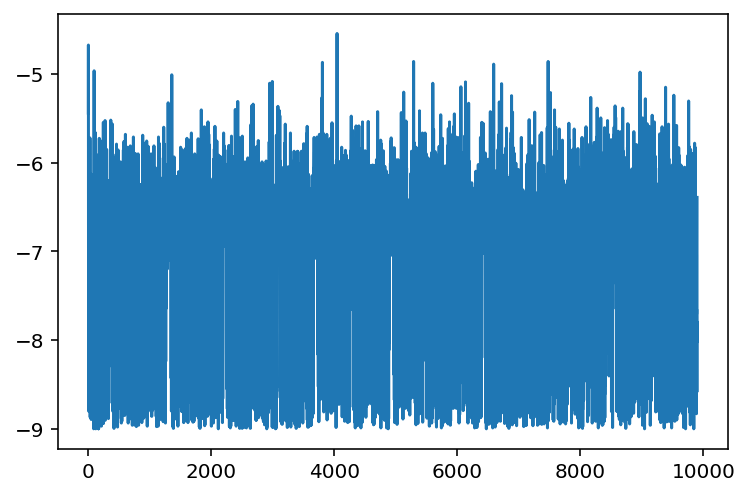

In [323]:
plt.plot(chain3[:,0]);
plt.show()

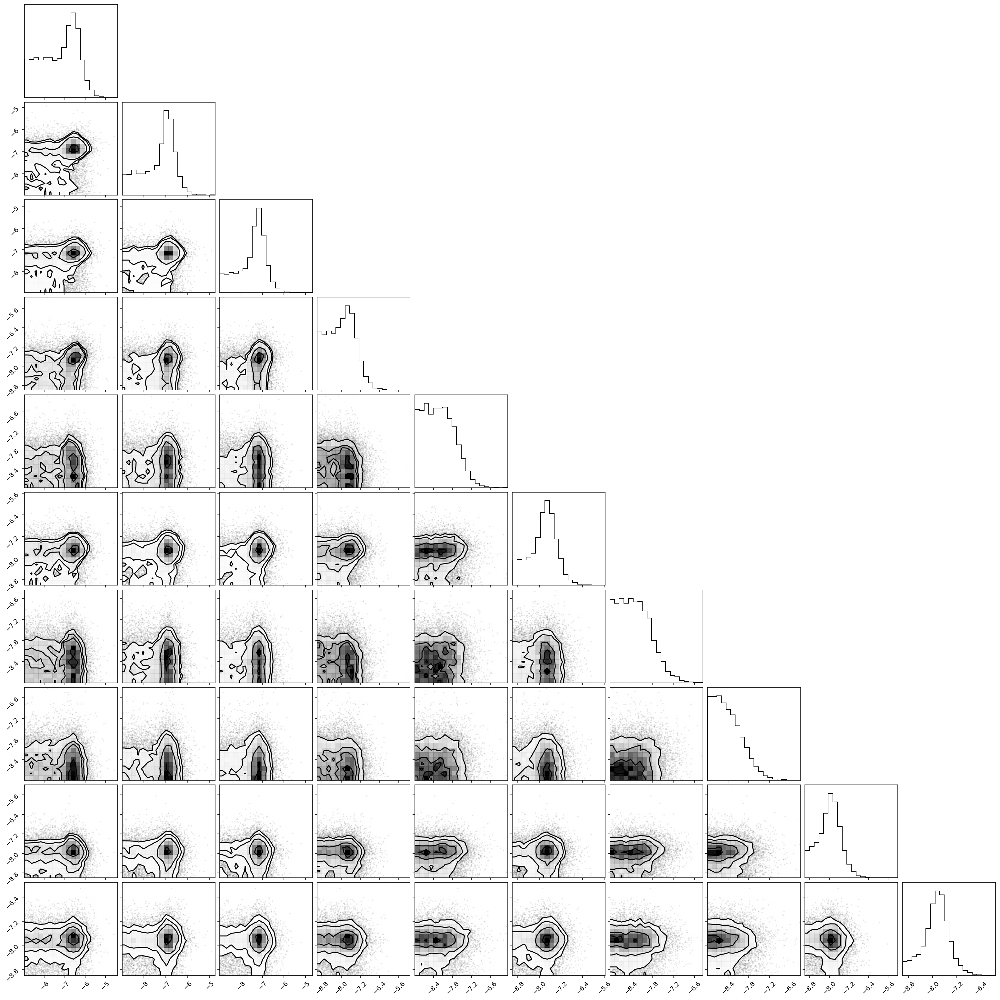

In [312]:
corner.corner(chain3[100:,:10]);

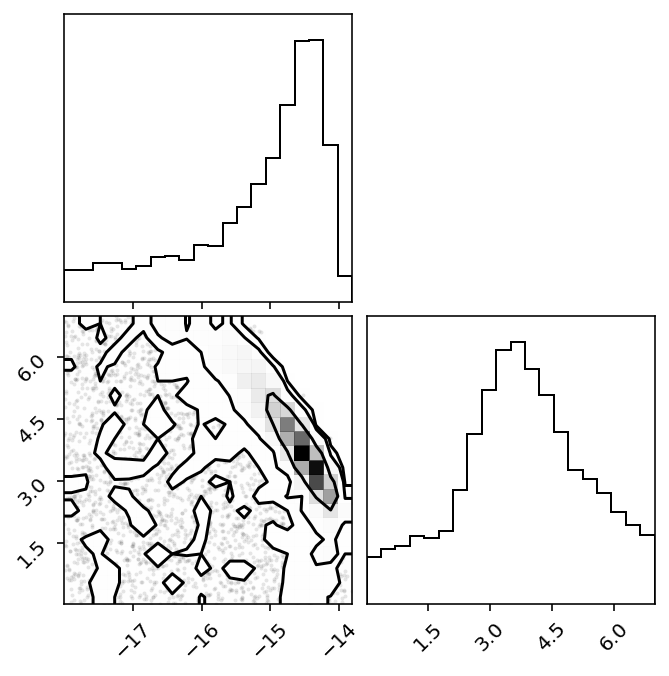

In [322]:
corner.corner(chain3[100:,[-1,-2]]);

In [321]:
for ii in range(32):
    print(acor.acor(chain3[100:,ii])[0])

7.4596541670570025
4.698364964392486
6.619358726137201
6.416350083476138
3.0912348412227906
8.376000511718633
2.547100819110404
2.5330260121937327
5.4114772775401505
4.494026401471974
3.466808799528403
4.027655395612966
3.912574407037453
12.983588454073619
13.359842317648608
4.690952718117046
5.952175485252519
5.629851641959154
2.813885728703445
3.475869155744315
2.7489536645948798
2.6070887633261544
3.4190020719434293
2.732371536002162
3.353854104466846
2.8125252975702053
3.886767252238944
3.8920039438487604
4.481406415430542
2.1635631248291407
22.770142388076337
21.112233593794546


## Let's try two pulsars

In [488]:
from pta_gibbs_proto import PTABlockGibbs3

In [537]:
parfiles = sorted(glob.glob('./*.par'))
timfiles = sorted(glob.glob('./*.tim'))

In [538]:
#epsrs = [Pulsar('J1713+0747.par','J1713+0747.tim'), Pulsar('J1909-3744.par','J1909-3744.tim')]
epsrs = []
for par,tim in zip(parfiles, timfiles):
    epsrs.append(Pulsar(par, tim))

In [693]:
##### parameters and priors #####

# Uniform prior on EFAC
efac = parameter.Constant(1.0)
ef = white_signals.MeasurementNoise(efac=efac)

# red noise 
rn = blocks.common_red_noise_block(psd='spectrum', components=5, name='gw')

rn += blocks.red_noise_block(psd='powerlaw', components=30)

# timing model
tm = gp_signals.TimingModel(use_svd=True)

# full model is sum of components
model = ef + rn + tm

# initialize PTA
pta_new = signal_base.PTA([model(pp) for pp in epsrs])

In [694]:
pta_new.params

[B1855+09_red_noise_gamma:Uniform(pmin=0, pmax=7),
 B1855+09_red_noise_log10_A:Uniform(pmin=-20, pmax=-11),
 B1937+21_red_noise_gamma:Uniform(pmin=0, pmax=7),
 B1937+21_red_noise_log10_A:Uniform(pmin=-20, pmax=-11),
 B1953+29_red_noise_gamma:Uniform(pmin=0, pmax=7),
 B1953+29_red_noise_log10_A:Uniform(pmin=-20, pmax=-11),
 J0023+0923_red_noise_gamma:Uniform(pmin=0, pmax=7),
 J0023+0923_red_noise_log10_A:Uniform(pmin=-20, pmax=-11),
 J0030+0451_red_noise_gamma:Uniform(pmin=0, pmax=7),
 J0030+0451_red_noise_log10_A:Uniform(pmin=-20, pmax=-11),
 J0340+4130_red_noise_gamma:Uniform(pmin=0, pmax=7),
 J0340+4130_red_noise_log10_A:Uniform(pmin=-20, pmax=-11),
 J0613-0200_red_noise_gamma:Uniform(pmin=0, pmax=7),
 J0613-0200_red_noise_log10_A:Uniform(pmin=-20, pmax=-11),
 J0636+5128_red_noise_gamma:Uniform(pmin=0, pmax=7),
 J0636+5128_red_noise_log10_A:Uniform(pmin=-20, pmax=-11),
 J0645+5158_red_noise_gamma:Uniform(pmin=0, pmax=7),
 J0645+5158_red_noise_log10_A:Uniform(pmin=-20, pmax=-11),
 J07

In [704]:
gibbs_new = PTABlockGibbs3(pta=pta_new, hypersample='conditional', redsample='mh')

ERROR: Gibbs outlier analysis must use basis_ecorr, not kernel ecorr


In [705]:
x0 = np.concatenate([p.sample().flatten() for p in gibbs_new.params])

In [706]:
gibbs_new.sample(x0, outdir='./gibbs_new_45psr_freespec_plaw2/', 
             niter=100000, resume=False)

Creating chain directory: ./gibbs_new_45psr_freespec_plaw2/


OverflowError: (34, 'Result too large')

In [676]:
chain_new = np.loadtxt('./gibbs_new_2psr_freespec/chain.txt')

In [677]:
gibbs_new.param_names

['B1855+09_red_noise_gamma',
 'B1855+09_red_noise_log10_A',
 'B1937+21_red_noise_gamma',
 'B1937+21_red_noise_log10_A',
 'B1953+29_red_noise_gamma',
 'B1953+29_red_noise_log10_A',
 'J0023+0923_red_noise_gamma',
 'J0023+0923_red_noise_log10_A',
 'J0030+0451_red_noise_gamma',
 'J0030+0451_red_noise_log10_A',
 'J0340+4130_red_noise_gamma',
 'J0340+4130_red_noise_log10_A',
 'J0613-0200_red_noise_gamma',
 'J0613-0200_red_noise_log10_A',
 'J0636+5128_red_noise_gamma',
 'J0636+5128_red_noise_log10_A',
 'J0645+5158_red_noise_gamma',
 'J0645+5158_red_noise_log10_A',
 'J0740+6620_red_noise_gamma',
 'J0740+6620_red_noise_log10_A',
 'gw_log10_rho_0',
 'gw_log10_rho_1',
 'gw_log10_rho_2',
 'gw_log10_rho_3',
 'gw_log10_rho_4',
 'gw_log10_rho_5',
 'gw_log10_rho_6',
 'gw_log10_rho_7',
 'gw_log10_rho_8',
 'gw_log10_rho_9']

In [678]:
len(gibbs_new.pta.pulsars)

10

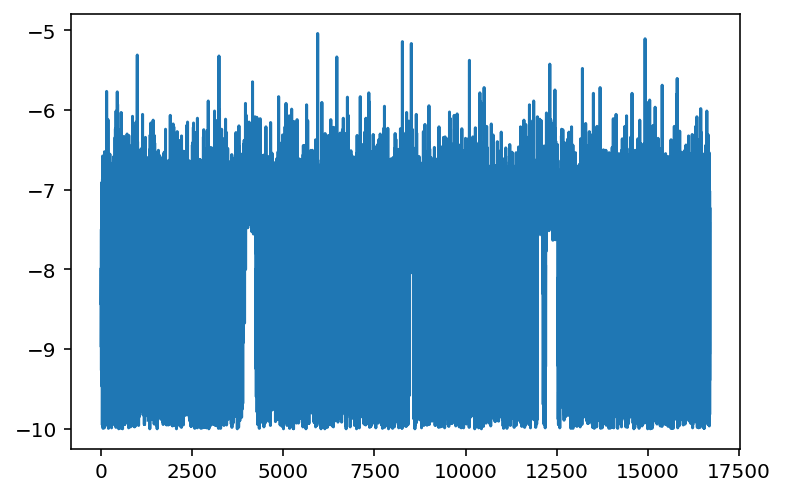

In [680]:
plt.plot(chain_new[:,91]);
plt.show()

In [681]:
chain_new.shape

(16701, 460)

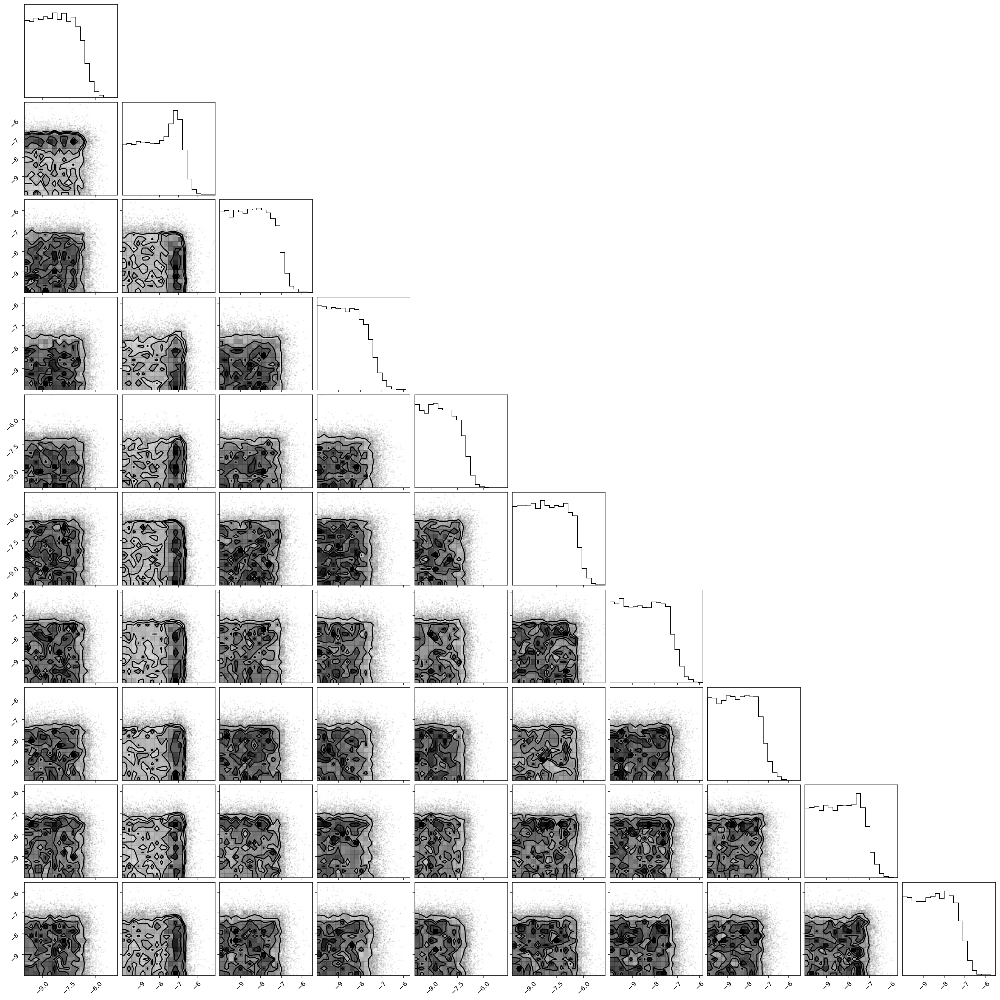

In [682]:
corner.corner(chain_new[2000:,90:100]);

In [653]:
# frequency data
Tspan = np.max([(pp.toas.max() - pp.toas.min()) for pp in epsrs])
inv_T = 1/Tspan
freqs = np.arange(1,31)*inv_T
no_freqs = len(freqs)

In [655]:
Tspan / 365.25 / 86400

15.06677406551554

In [650]:
rho_labels = ['gw_log10_rho_'+str(ii) for ii in range(10)]
freespec_new = pd.read_csv('./gibbs_new_2psr_freespec/chain.txt', 
                           usecols=list(range(450,460)),
                           names=rho_labels, 
                           delim_whitespace=True)

In [656]:
# -------
# plotting violin plots
rho_bins = np.linspace(-9, -4, num=400) # rho bins
drho = rho_bins[1]-rho_bins[0]

# turning freespec into rv hist and sampling
epsilon = 1e-250  # make histograms for each rho
histograms = np.array([np.histogram(freespec_new[rho], rho_bins, density=True)[0]
                       for rho in rho_labels])

bin_mid = (rho_bins[1:] + rho_bins[:-1]) / 2.0
rvhist = [rv_histogram([hist, rho_bins]) for hist in histograms]

# draw samples from histograms for each rho
rv_samples = [rvh.rvs(size=100000) for rvh in rvhist]

# calculate powerlaw
p0 = [13/3, -14.7]
pl = powerlaw(*p0)[:10]

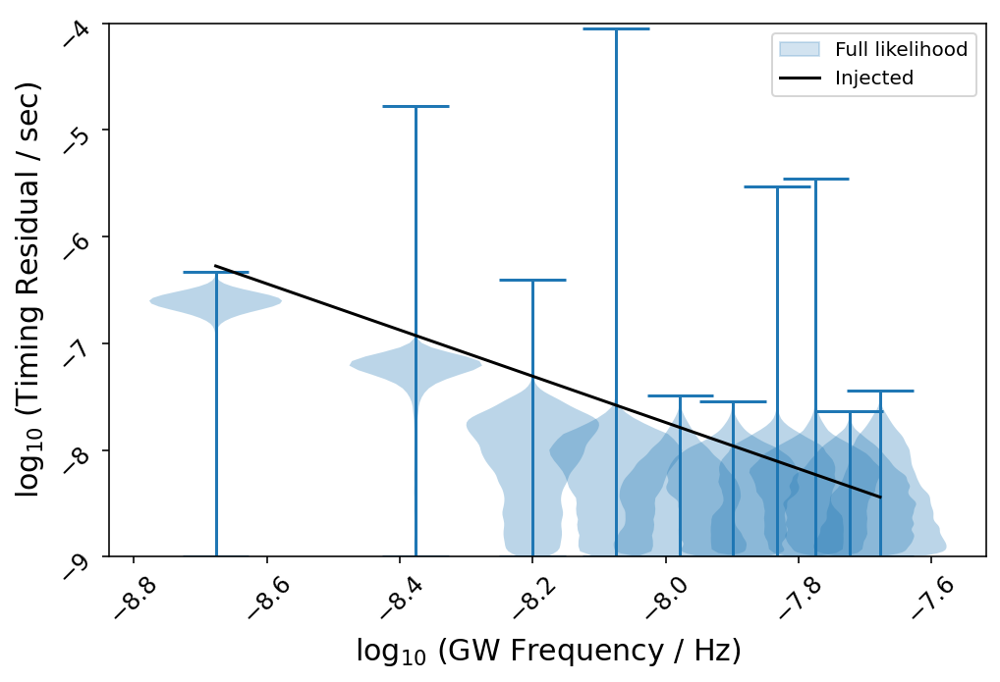

In [657]:
# overplot powerlaw on violinplot of random samples
plt.figure(figsize=(8,8))
v1 = plt.violinplot(rv_samples, positions=np.log10(freqs)[:10], widths=0.2)

plt.plot(np.log10(freqs)[:10], pl, color='k')
plt.xlabel(r'$\log_{10}$ (GW Frequency / Hz)', fontsize=15)
plt.ylabel(r'$\log_{10}$ (Timing Residual / sec)', fontsize=15);

import matplotlib.patches as mpatches
import matplotlib.lines as mlines

fs = mpatches.Patch(color='C0', label='Full likelihood', alpha=0.2)
plp = mlines.Line2D([], [], color='k', label='Injected')
plt.legend(handles=[fs, plp])

plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12, rotation=45)

plt.ylim(-9,-4)

fig = matplotlib.pyplot.gcf()
fig.set_size_inches(8, 5)
plt.show()
#plt.savefig('/home/taylosr8/pta_work/gfl_spec_nsfproposal_pilot2.pdf',bbox_inches='tight',dpi=400)